In [5]:
from astropy.io import ascii 
from astropy.table import Table
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord
from astropy import units as u
# from astropy.cosmology import WMAP9 as cosmo
from astropy.modeling import models, fitting
import os
import pickle
from scipy.optimize import curve_fit
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
import multiprocessing as mp

In [3]:
#total catalog from COSMOS(2016)
total = Table.read('./datas/cosmos2015_2.fits')

#mass complete sample
total_z = total[(total['zphot'] > 0) & (total['zphot'] < 9) & (total['OType'] == 0) & (total['Mass'] > 9.545)]

In [4]:
total_pd = total_z.to_pandas()

# Load catalog & functions

In [6]:

#find grid step: 100kpc
def find_grid_step(z):
    sep = cosmo.arcsec_per_kpc_proper(z) * 100 * u.kpc
    return sep.to(u.deg).value

#find bin size
def find_bin_size(z):
    del_z = 0.015 * (1+z)
    return del_z

#find search radius: 700kpc
def find_search_radius(z):
    r = cosmo.arcsec_per_kpc_proper(z) * 700 * u.kpc # arcsec
    
    return r.to(u.deg).value

#find redshift increment next to z
def find_bin_step(z):
    closest = 0
    compare_v = 100
    
    for i in np.arange(z+0.03, z, -0.00001):
        v = cosmo.H0 * (cosmo.comoving_distance(i) - cosmo.comoving_distance(z)) 
#         
        if np.abs(v.value - 1500) < compare_v:
            closest = i
            compare_v = np.abs(v.value - 1500)
#             print(compare_v, end = ' ')
    #return next z
    return closest



In [9]:
redshifts = np.load('bins/bins_cosmos/search_700kpc/redshifts/redshifts.npy')
binsize = np.load('bins/bins_cosmos/search_700kpc/redshifts/binsize.npy')

In [10]:
#xray 2018
x_new = ascii.read('./datas/xray_2018.txt')
bellagamba = Table.read('./datas/bellagamba2011')
bellagamba = bellagamba.to_pandas()

In [11]:
# hasinger = Table.read('./datas/Hasinger_10k_spec_z')
hasinger = Table.read('./datas/Hasinger_crossmatch')

# Find overdense area

In [12]:
file_list = os.listdir(f'./bins/bins_cosmos/search_700kpc/')
file_list.sort()

mask1_list = os.listdir(f'./bins/bins_cosmos/search_700kpc/mask1_10/')
mask2_list = os.listdir(f'./bins/bins_cosmos/search_700kpc/mask2_10/')
mask1_list.sort()
mask2_list.sort()

xlist = os.listdir('./bins/bins_cosmos/search_700kpc/grid_x/')
ylist = os.listdir('./bins/bins_cosmos/search_700kpc/grid_y/')

xlist.sort()
ylist.sort()

## Find connected overdense region

In [13]:
od_ra = []
od_dec = []
od_z = []


In [23]:
def overdense(od):
    od_ra = []
    od_dec = []
    od_z = []

    for i in range(len(redshifts)):
    # for i in range(1):
        od_z_ra = []
        od_z_dec = []
        od_z_z = []
        print(i, end = ' ')
        grid = np.load('./bins/bins_cosmos/search_700kpc/' + file_list[i])
        mask1 = np.load('./bins/bins_cosmos/search_700kpc/mask1_10/' + mask1_list[i])
        mask2 = np.load('./bins/bins_cosmos/search_700kpc/mask2_10/' + mask2_list[i])

        #grid separation = 0.1Mpc
        bs = binsize[i] #binsize
        z = redshifts[i]

        gstep = find_grid_step(redshifts[i])

        grid_x = np.load('./bins/bins_cosmos/search_700kpc/grid_x/' + xlist[i])
        grid_y = np.load('./bins/bins_cosmos/search_700kpc/grid_y/' + ylist[i])


        grid_1d = grid[mask1 & mask2]
        mean = grid_1d.mean()

        std = grid_1d.std()

        overdense_mask = grid >= mean + od * std
        sparse_mask = grid < mean + od * std

        ras = grid_x[overdense_mask & mask1 & mask2]
        decs = grid_y[overdense_mask & mask1 & mask2]

        plt.figure()

        plt.scatter(grid_x[mask1 & mask2], grid_y[mask1 & mask2], color = 'grey', alpha =  .005)
        plt.scatter(ras, decs, color = 'royalblue', alpha =  .3)

        #save checked
        checked = np.full(ras.shape, True, dtype = bool)

        for k in range(len(ras)):
            #itself
            if not checked[k]:
                print('already checekd')
                continue
            else:
                print('find its first friends')

            ra = ras[k]
            dec = decs[k]
            checked[k] = False

    #         temp_checked = []

            coord_mask = ((ras - ra)**2 + (decs - dec)**2 <=  2 *gstep**2)  
            check_index = np.where(ras[coord_mask & checked])[0]

            #if it has no member
            if len(ras[coord_mask & checked]) == 0:
                print('no friends found')
                continue

            #friends
            friends_ra = ras[coord_mask & checked]
            friends_dec = decs[coord_mask & checked]
            checked[check_index] = False

            #update
            final_ra = np.concatenate([np.array([ra]), friends_ra])
            final_dec = np.concatenate([np.array([dec]), friends_dec])

            #find its friends of friends
            flag = True
            first = True

            new_ra = np.array([])
            new_dec = np.array([])
            while flag:

                if first:
                    first = False
                    cand_ra = friends_ra.copy()
                    cand_dec = friends_dec.copy()
                else:
                    cand_ra = temp_ra.copy()
                    cand_dec = temp_dec.copy()


                temp_ra = np.array([])
                temp_dec = np.array([])

                for l in range(len(cand_ra)):
                    ra2 = cand_ra[l]
                    dec2 = cand_dec[l]
                    sec_index = np.where((ras == ra2) & (decs == dec2))[0]

                    if not checked[sec_index]:
                        continue
                    else:
                        checked[sec_index] = False

                    coord_mask2 = ((ras - ra2)**2 + (decs - dec2)**2 <= 2 * gstep**2)
                    check_index2 = np.where(ras[coord_mask2 & checked])[0] 

                    if len(ras[coord_mask2 & checked])  == 0:
                        continue


                    #friends
                    temp_ra = np.concatenate([temp_ra, ras[coord_mask2 & checked]])
                    temp_dec = np.concatenate([temp_dec, decs[coord_mask2 & checked]])

                    checked[check_index2] = False

                if len(temp_ra) > 0:
                    print(f'+{len(temp_ra)}')
                    new_ra = np.concatenate([new_ra, temp_ra])
                    new_dec= np.concatenate([new_dec, temp_dec])
                else:
                    flag = False


            final_ra = np.concatenate([final_ra, new_ra])
            final_dec = np.concatenate([final_dec, new_dec])

            if len(final_ra) >= 10:        
                od_z_ra.append(final_ra)
                od_z_dec.append(final_dec)
                od_z_z.append(i)

                plt.scatter(final_ra, final_dec, color = 'firebrick', alpha = .2, s = 10)

            else:
                plt.scatter(final_ra, final_dec, color = 'yellow', alpha = .2, s = 10)
                print('less than 10 members')
#         plt.savefig(f'check/check{i}.png')
        od_ra.append(od_z_ra)
        od_dec.append(od_z_dec)
        od_z.append(od_z_z)


    return od_ra, od_dec, od_z

0 find its first friends
+4
+6
+10
+11
+8
+10
+12
+8
+2
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+17
+14
+8
+11
+20
+5
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+1
+1
less t

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
find its first friends
+12
+17
+10
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
+15
+20
+26
+37
+52
+60
+68
+71
+57
+45
+26
+10
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
less than 10 members
already checekd
already checekd
already checekd
already chec

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+4
+7
+8
+11
+11
+12
+12
+12
+12
+7
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already ch

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+2
+1
less than 10 members
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
find its first friends
+6
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+3
+5
+8
+12
+17
+22
+21
+20
+11
+7
+7
+4
+2
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
a

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+3
+7
+12
+13
+15
+18
+20
+21
+21
+23
+20
+17
+18
+17
+19
+8
+2
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
a

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
11 find its first friends
less than 10 members
already checekd
find its first friends
no friends found
find its first friends
+10
+11
+8
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+2
+1
less than 10 members
find its first friends
no friends found
already checekd
already checekd
already checekd
find its first friends
less than 10 members
find its first friends
+8
+17
+15
+14


already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+1
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+2
+5
+8
+11
+13
+15
+12
+8
+7
+8
+9
+8
+4
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
15 find its first friends
less than 10 members
already checekd
already checekd
already checekd
find its first friends
+7
+1
already checekd
already checekd
find its fir

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+18
+31
+39
+49
+64
+69
+65
+65
+72
+85
+85
+90
+96
+109
+117
+103
+104
+108
+101
+97
+98
+74
+65
+68
+51
+31
+36
+44
+48
+52
+49
+30
+22
+23
+11
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+1
+3
+7
+4
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
alread

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd


already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
18 find its first friends
+2
+4
+7
+7
+7
+2
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
+2
+2
less than 10 me

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd


already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already chec

already checekd
already checekd
already checekd
already checekd
20 

/home/ehko/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


find its first friends
+12
+24
+31
+24
+13
+8
+7
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+12
+19
+9
+6
+8
+8
+8
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
alr

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+11
+19
+22
+27
+38
+40
+38
+43
+39
+7
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already ch

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
no friends found
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+5
+9
+11
+13
+15
+16
+18
+18
+16
+13
+14
+12
+6
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
alrea

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+1
less than 10 members
already checekd
already checekd
find its first friends
+4
+6
+8
+10
+9
+10
+13
+15
+19
+24
+25
+25
+25
+26
+25
+24
+24
+24
+25
+24
+24
+22
+19
+18
+18
+14
+14
+15
+13
+7
+5
+2
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already c

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+3
+5
+6
+8
+8
+10
+10
+12
+13
+14
+12
+10
+8
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd


already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
25 find its first friends
+3
+6
+9
+12
+16
+20
+18
+16
+15
+13
+12
+10
+8
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already che

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd


already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+18
+31
+38
+42
+52
+69
+66
+59
+52
+37
+12
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already chece

already checekd
find its first friends
+10
+26
+43
+38
+34
+33
+29
+19
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checek

already checekd
find its first friends
+9
+14
+20
+7
already checekd
already checekd
already checekd
already checekd
find its first friends
+16
+23
+23
+23
+26
+18
+16
+14
+10
+15
+25
+34
+37
+40
+47
+50
+48
+52
+62
+64
+68
+67
+68
+54
+48
+45
+45
+43
+40
+35
+42
+37
+14
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
alrea

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+18
+31
+42
+51
+48
+37
+29
+22
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checek

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
find its first friends
+13
+22
+29
+38
+45
+48
+42
+20
+5
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already che

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+3
+4
+6
+5
+3
+4
+4
+3
+1
+1
+1
+2
+4
+5
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first frien

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+2
+2
+1
less than 10 members
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
find its first friends
no friends found
already checekd
find its first friends
+4
+6
+9
+13
+16
+18
+21
+21
+22
+24
+25
+26
+27
+26
+22
+12
+10
+10
+8
+8
+6
+6
+6
+3
+1
+1
already checekd
already checekd
already checekd
already checekd
already checekd

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+4
+7
+7
+6
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+1
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
find its first frie

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
find its first friends
+3
+7
+10

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+3
+6
+7
+6
+4
+1
+1
+2
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
+5
+5
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+10
+13
+14
+18
+23
+31
+39
+47
+35
+9
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
+12
+21
+28
+19
+11
+5
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+5
+8
+7
+6
+5
+1
already checekd
already checekd
already checekd
already che

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already 

already checekd
find its first friends
+4
+4
+5
+5
+4
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd

already checekd
already checekd
already checekd
find its first friends
+12
+7
+12
+22
+30
+32
+26
+22
+26
+27
+21
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+18
+33
+45
+55
+63
+66
+59
+51
+48
+48
+54
+42
+34
+41
+50


already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+12
+22
+23
+23
+31
+38
+26
+17
+15
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+17
+28
+36
+40
+44
+47
+52
+60
+49
+33
+27
+18
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd


already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+5
+5
+5
+5
+7
+10
+13
+17
+20
+18
+19
+19
+17
+15
+8
+6
already checekd
already checekd
already 

already checekd
find its first friends
+3
+7
+10
+14
+16
+15
+12
+13
+15
+9
+8
+8
+8
+4
+2
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already chece

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd


already checekd
already checekd
already checekd
already checekd
already checekd
53 find its first friends
no friends found
find its first friends
+1
less than 10 members
already checekd
find its first friends
+4
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
less than 10 members
find its first friends
+3
+2
less than 10 members
already checekd
already checekd
already checekd
already checekd
find its first friends
+2
+1
+1
+1
+1
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
+5
+6
+9
+13
+17
+17
+10
+9
+9
+9
+4
+2
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already c

already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
+2
+4
+7
+11
+11
+13
+17
+20
+13
+13
+11
+10
+7
+5
+4
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+2
+5
+8
+11
+11
+13
+16
+19
+15
+16
+18
+20
+19
+16
+16
+16
+3
+4
+6
+6
+5
+5
+2
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd

no friends found
find its first friends
less than 10 members
already checekd
find its first friends
+1
+1
+2
+1
less than 10 members
find its first friends
no friends found
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
find its first friends
less than 10 members
already checekd
find its first friends
no friends found
find its first friends
less than 10 members
already checekd
find its first friends
no friends found
find its first friends
no friends found
find its first friends
no friends found
56 find its first friends
+2
+4
+6
+6
+3
+3
+3
+3
+4
+5
already checekd
already checekd
already checekd
already checekd
find its first friends
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already

already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
62 find its first friends
+12
+22
+22
+23
+24
+26
+19
+11
+12
+6
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already

already checekd
already checekd
already checekd
already checekd
find its first friends
+4
+4
+2
+2
+3
+5
+2
+1
already checekd
already checekd
find its first friends
+1
+2
+2
+1
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+2
+4
+7
+10
+12
+12
+11
+10
+6
+7
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+1
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd


already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+1
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+3
+5
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
find its first friends
no friends found
already checekd
find its first friends
less than 10 members
already checekd
find its first friends
no friends found
find its first friends
less than 10 members
already checekd
find its first friends
+5
less than 10 members
already checekd
find its first friends
+1
+3
+8
+6
+1
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd

less than 10 members
already checekd
find its first friends
+2
+2
+5
+2
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
find its first friends
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+8
+6
+11
+21
+33
+29
+15
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+12
+12
+7
+3
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
alr

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
find its first friends
+11
+18
+20
+18
+7
+1
+2
+2
+1
already checekd
already checekd
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+1
less than 10 members
already checekd
already checekd
find its first friends
no friends found
find its first friends
+4
+1
less than 10 members
already checekd
already checekd
find its first friends
no friends found
already checekd
already checekd
already chece

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already 

already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
find its first friends
+5
less than 10 members
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already checekd
already c

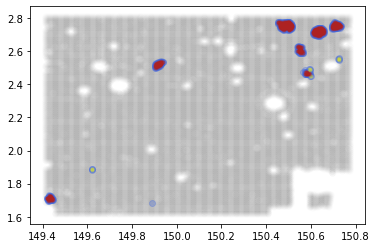

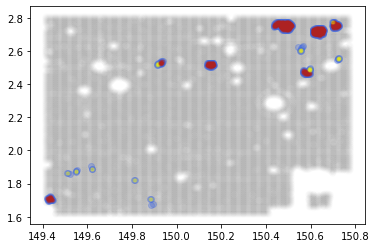

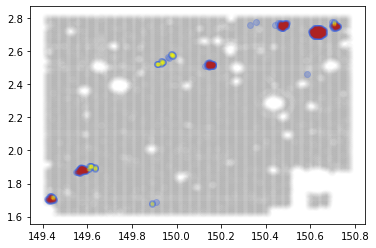

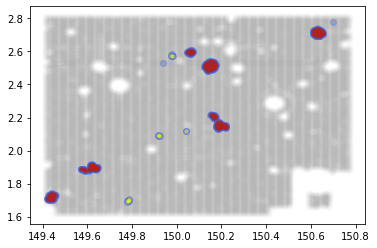

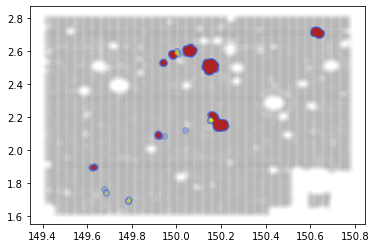

...

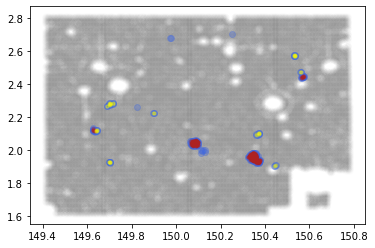

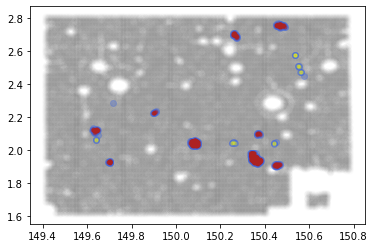

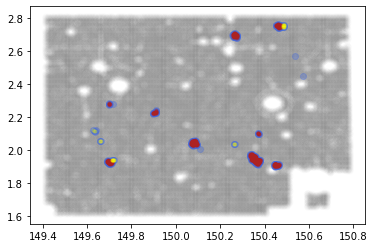

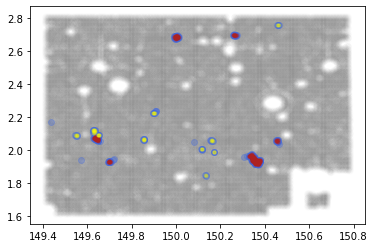

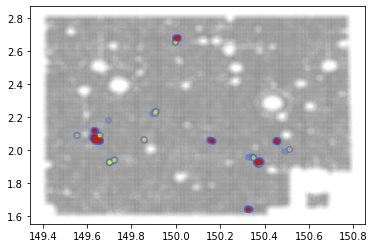

In [24]:
od = 4
od_ra, od_dec, od_z = overdense(od)

## stack connected overdense region along z

In [20]:
def find_connection(od_ra, od_dec, od_z):
    index1 = []
    index2 = []
    z_idx = []

    #just for check
    check_z = np.array([])  #check_1
    check_idx = np.array([]) # check_2

    for z in range(len(od_ra)-1):
        print(f'start {z}', end = ' ')
        for i in range(len(od_ra[z])):
            if len(od_ra[z][i]) > 9:
                print('enough connection')
            else:
                print('not enough!')
                continue

            ra_center = od_ra[z][i].mean()
            dec_center = od_dec[z][i].mean()

            zlist = []
            zlist.append(z)
            idxlist = [] #jlist
            idxlist.append(i) #jlist

            zid_list = []
            zid_list = [od_z[z][i]]

            zz = z  + 1
            print(' find its z friends')
            while True:
                if zz == len(od_ra) - 1:
                    print(' out of index')
                    break

                count = 0

                for j in range(len(od_ra[zz])):
                    ra_cand = od_ra[zz][j].mean()
                    dec_cand = od_dec[zz][j].mean()

                    if (ra_center - ra_cand)**2 + (dec_center - dec_cand)**2 < 0.001:
                        zlist.append(zz)
                        idxlist.append(j)
                        count += 1

                if count == 0:
                    print('no z friends')
                    break

                zz += 1

            if sum(np.isin(check_z, zlist) & np.isin(check_idx, idxlist)) > 0:
                print(' already counted')
            else:
                if len(zlist) > 2:
                    print(' found!')
                    index1.append(zlist)
                    index2.append(idxlist)
                    z_idx.append(zid_list)

                    check_z = np.concatenate([check_z, np.array(zlist)])
                    check_idx = np.concatenate([check_idx, np.array(idxlist)])


    return index1, index2, z_idx

In [25]:
index1, index2, z_idx = find_connection(od_ra, od_dec, od_z)

start 0 enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 found!
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 found!
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
start 1 enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 found!
enough connection
 find i

start 18 enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
start 19 enough connection
 find its z friends
no z friends
 found!
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
start 20 enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z frie

 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
start 34 enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 found!
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 already counted
start 35 enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find

no z friends
start 44 enough connection
 find its z friends
no z friends
 found!
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
start 45 enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 found!
enough connection
 find its z friends
no z friends
e

enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 found!
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 already counted
start 58 enough connection
 find its z friends
no z friends
 found!
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find its z friends
no z friends
 already counted
enough connection
 find

enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
start 71 enough connection
 find its z friends
no z friends
enough connection
 find its z friends
 out of index
 already counted
enough connection
 find its z friends
 out of index
 already counted
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
no z friends
enough connection
 find its z friends
 out of index
 already counted
enough connection
 find its z friends
no z friends
start 72 enough connection
 find its z friends
 out of index
 already counted
enough connection
 find its z friends
 out of index
enough connection
 find its z friends
 out of index
enough connection
 find its z friends
 out of index
enough connection
 find its z friends
 out of index
enough connection
 find its z friends
 out of index
 already counted


In [26]:
len(index1) #number of overdense region #104

49

In [27]:
import seaborn as sns

/home/ehko/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


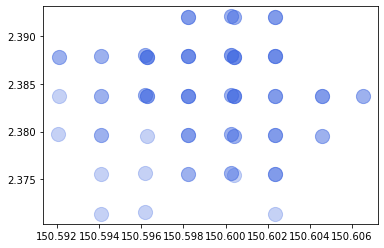

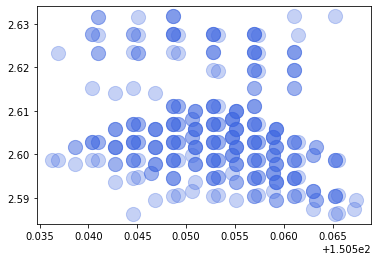

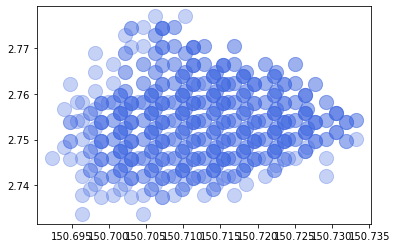

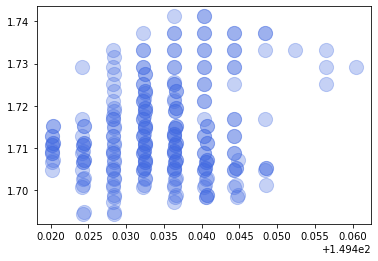

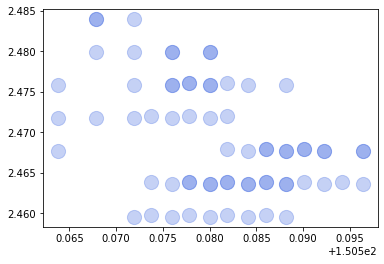

...

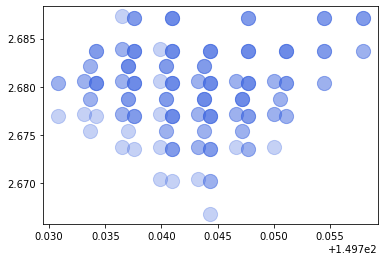

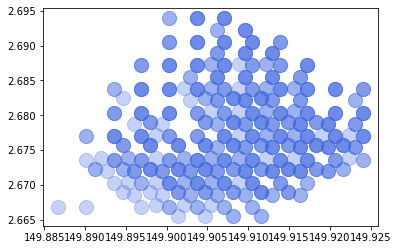

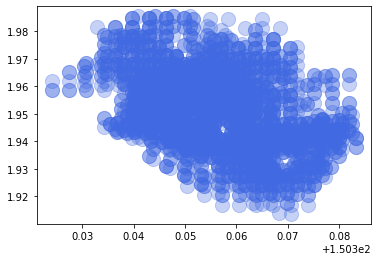

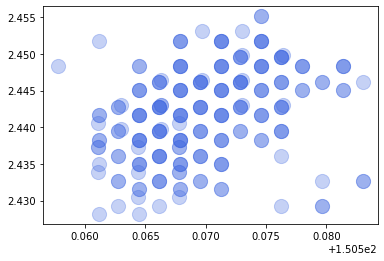

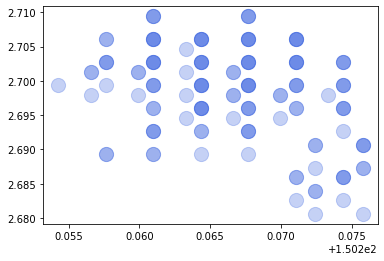

In [28]:
for i in range(len(index1)):
    
    plt.figure()
#     colors = sns.color_palette('flare',len(index1[i]))
    
    for j in range(len(index1[i])):
        plt.scatter(od_ra[index1[i][j]][index2[i][j]], od_dec[index1[i][j]][index2[i][j]], color = 'royalblue', s = 200 ,alpha = .3)
#         ra_mean = np.mean(od_ra[index1[i][j]][index2[i][j]])
#         dec_mean = np.mean(od_dec[index1[i][j]][index2[i][j]])
#         ax.scatter(ra_mean, dec_mean, color = colors[j], s = 50)
        

/home/ehko/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


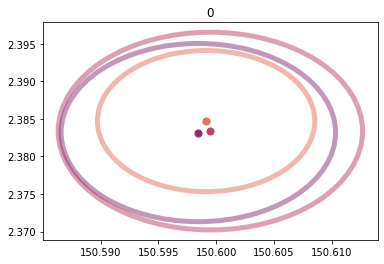

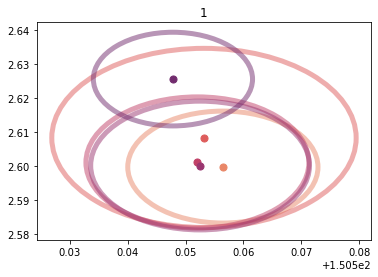

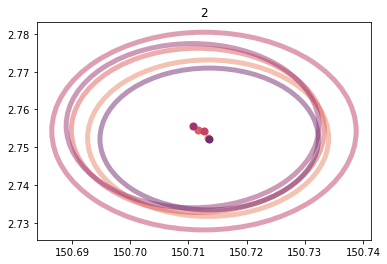

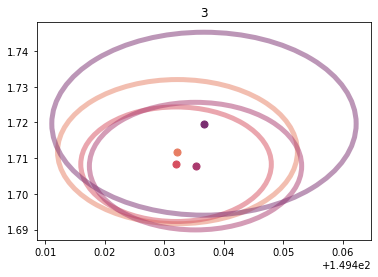

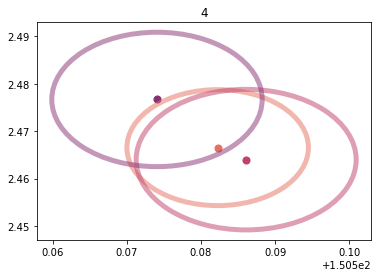

...

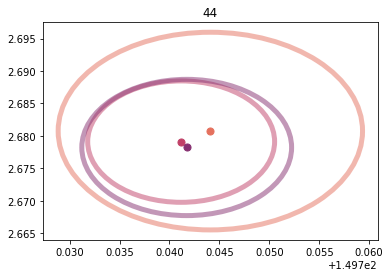

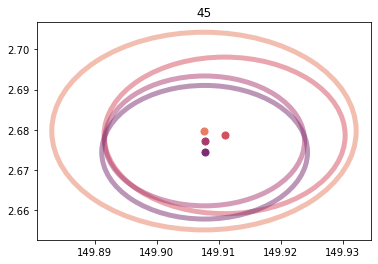

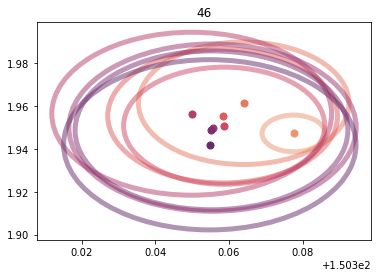

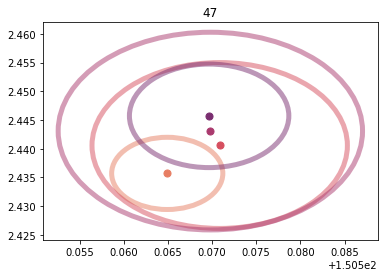

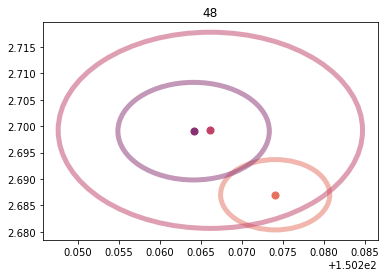

In [29]:
for i in range(len(index1)):
    
    fig, ax = plt.subplots()
    colors = sns.color_palette('flare',len(index1[i]))
    
    for j in range(len(index1[i])):
#         plt.scatter(od_ra[index1[i][j]][index2[i][j]], od_dec[index1[i][j]][index2[i][j]])
        ra_mean = np.mean(od_ra[index1[i][j]][index2[i][j]])
        dec_mean = np.mean(od_dec[index1[i][j]][index2[i][j]])
        ax.scatter(ra_mean, dec_mean, color = colors[j], s = 50)
        
        rad = (ra_mean - od_ra[index1[i][j]][index2[i][j]])**2 + (dec_mean - od_dec[index1[i][j]][index2[i][j]])**2
        rad = np.sqrt(rad)
        rad_idx = np.argmax(rad)
        
        circle = plt.Circle((ra_mean, dec_mean), rad[rad_idx], fill = False, color = colors[j], lw = 5, alpha = .5)
        ax.add_patch(circle)
    ax.set_title(f'{i}')
    
    #save
    path = f'check/candidates/'
    if not os.path.isdir(path):
        os.makedirs(os.path.join(path))
    
#     plt.savefig(path + f'circles{i}.png')

In [ ]:
#save index of overdense region
with open(f'./datas/index1_od{od}.txt', 'wb') as f:
    pickle.dump(index1, f)

with open(f'./datas/index2_od{od}.txt', 'wb') as f:
    pickle.dump(index2, f)

with open(f'./datas/od{od}_ra.txt', 'wb') as f:
    pickle.dump(od_ra, f)
    
with open(f'./datas/od{od}_dec.txt', 'wb') as f:
    pickle.dump(od_dec, f)
    
with open(f'./datas/z_idx_od{od}.txt', 'wb') as f:
    pickle.dump(z_idx, f)

# Candidates

In [30]:
file_list = os.listdir(f'./bins/bins_cosmos/search_700kpc/')
file_list.sort()

mask1_list = os.listdir(f'./bins/bins_cosmos/search_700kpc/mask1_10/')
mask2_list = os.listdir(f'./bins/bins_cosmos/search_700kpc/mask2_10/')
mask1_list.sort()
mask2_list.sort()

xlist = os.listdir('./bins/bins_cosmos/search_700kpc/grid_x/')
ylist = os.listdir('./bins/bins_cosmos/search_700kpc/grid_y/')

xlist.sort()
ylist.sort()

In [31]:
od = 4
#save index of overdense region
with open(f'./datas/index1_od{od}.txt', 'rb') as f:
    index1 = pickle.load(f)

with open(f'./datas/index2_od{od}.txt', 'rb') as f:
    index2 = pickle.load(f)

with open(f'./datas/od{od}_ra.txt', 'rb') as f:
    od_ra = pickle.load(f)

with open(f'./datas/od{od}_dec.txt', 'rb') as f:
    od_dec = pickle.load(f)

with open(f'./datas/z_idx_od{od}.txt', 'rb') as f:
    z_idx = pickle.load(f)

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 

/home/ehko/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 

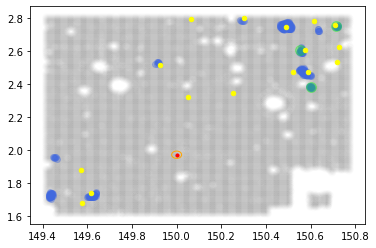

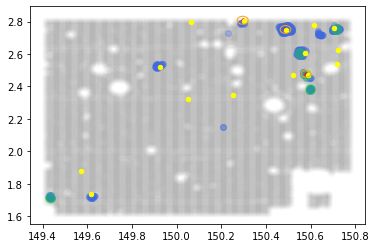

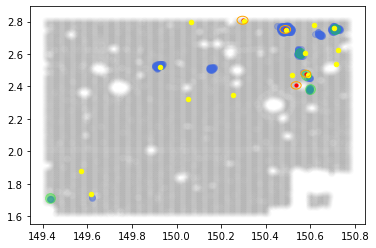

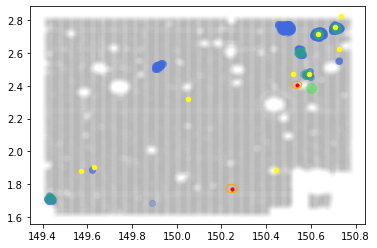

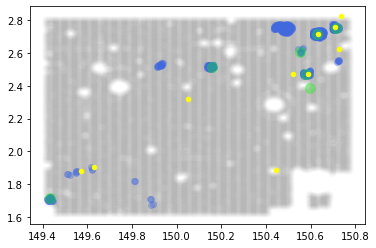

...

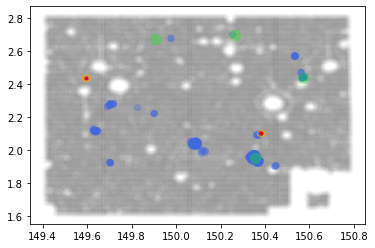

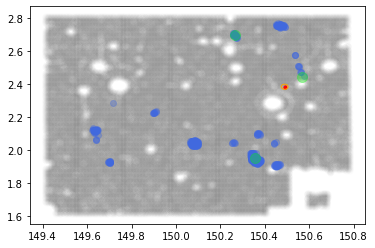

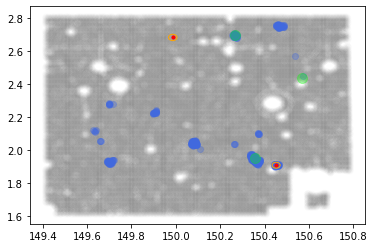

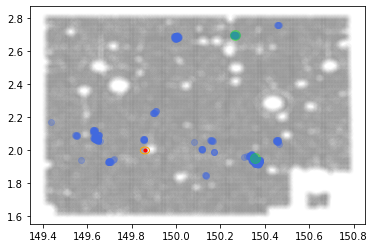

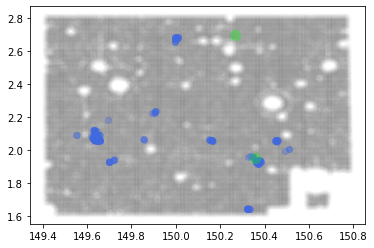

In [32]:
for i in range(len(redshifts)):
    
    print(i, end = ' ')
    
    grid = np.load('./bins/bins_cosmos/search_700kpc/' + file_list[i])
    mask1 = np.load('./bins/bins_cosmos/search_700kpc/mask1_10/' + mask1_list[i])
    mask2 = np.load('./bins/bins_cosmos/search_700kpc/mask2_10/' + mask2_list[i])

    #grid separation = 0.1Mpc
    bs = binsize[i] #binsize
    z = redshifts[i]

    gstep = find_grid_step(redshifts[i])

    grid_x = np.load('./bins/bins_cosmos/search_700kpc/grid_x/' + xlist[i])
    grid_y = np.load('./bins/bins_cosmos/search_700kpc/grid_y/' + ylist[i])


    grid_1d = grid[mask1 & mask2]
    mean = grid_1d.mean()

    std = grid_1d.std()

    overdense_mask = grid >= mean + od * std
    sparse_mask = grid < mean + od * std

    ras = grid_x[overdense_mask & mask1 & mask2]
    decs = grid_y[overdense_mask & mask1 & mask2]

    fig, ax = plt.subplots()

    plt.scatter(grid_x[mask1 & mask2], grid_y[mask1 & mask2], color = 'grey', alpha =  .005)
    plt.scatter(ras, decs, color = 'royalblue', alpha =  .3)
    
    
        #found overdenses
    for j in range(len(index1)):
        zz = redshifts[index1[j]]
        
        if np.any(np.abs(zz - z) < 0.02):
            ra_all = []
            dec_all = []
            for k in range(len(index1[j])):
                ra = od_ra[index1[j][k]][index2[j][k]]
                dec = od_dec[index1[j][k]][index2[j][k]]
                ra_all.extend(ra)
                dec_all.extend(dec)
                
            ra_mean = np.mean(ra_all)
            dec_mean = np.mean(dec_all)
            
            plt.scatter(ra_mean, dec_mean, color = 'lime', s = 100, alpha = .3)
            
    
    
    xzmask = (x_new['redshift'] >= redshifts[i] - 0.005) & (x_new['redshift'] <= redshifts[i] + 0.005)
    xsample = x_new[xzmask]
    for k in range(len(xsample)):

        ax.scatter(xsample['Ra'][k], xsample['Dec'][k], s = 10, color = 'red')
        circle = plt.Circle((xsample['Ra'][k], xsample['Dec'][k]), xsample['R200_deg'][k], fill = False, color = 'orange')
        ax.add_patch(circle)
    
    bzmask = (bellagamba['z'] >= redshifts[i] - 0.02) & (bellagamba['z'] <= redshifts[i] + 0.02)
    bsample = bellagamba[bzmask]
    ax.scatter(bsample['RAJ2000'], bsample['DEJ2000'], s = 20, color = 'yellow')
#     plt.savefig(f'check/clusters/clusters{i}.png')
    

In [33]:
redshifts

array([0.6    , 0.60696, 0.61395, 0.62097, 0.62802, 0.6351 , 0.64221,
       0.64935, 0.65652, 0.66372, 0.67095, 0.67822, 0.68552, 0.69285,
       0.70021, 0.7076 , 0.71503, 0.72249, 0.72998, 0.73751, 0.74507,
       0.75267, 0.7603 , 0.76797, 0.77567, 0.78341, 0.79118, 0.79899,
       0.80683, 0.81471, 0.82263, 0.83059, 0.83858, 0.84661, 0.85468,
       0.86279, 0.87094, 0.87913, 0.88736, 0.89563, 0.90394, 0.91229,
       0.92068, 0.92911, 0.93758, 0.9461 , 0.95466, 0.96326, 0.9719 ,
       0.98059, 0.98932, 0.9981 , 1.00692, 1.01579, 1.0247 , 1.03366,
       1.04267, 1.05172, 1.06082, 1.06997, 1.07917, 1.08842, 1.09771,
       1.10705, 1.11644, 1.12588, 1.13538, 1.14493, 1.15453, 1.16418,
       1.17388, 1.18364, 1.19345, 1.20332])